In [282]:
import numpy as np
from numpy import matlib

import pandas as pd
import math
import matplotlib.pyplot as plt

from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans



In [283]:
wine = datasets.load_wine()
#wine = wine['data']
feature_names = wine['feature_names']

data = pd.DataFrame(wine['data'], columns=feature_names)


In [284]:
#Get normalized data
def normalize(data): 
    normData = data.copy()
    for col in normData.columns:
        #print(col, end=': ')
        mean = np.mean(normData[col])
        #print('mean', mean, end='; ')
        std = np.std(normData[col])
        #print('std', std)
        #print()
        #normData.index
        for row in normData.index:
            #print('x', normData.iloc[row])
            #print('mean', mean)
            #print('std', std)
            normData.loc[row, col] = (normData.loc[row, col] - mean) / std
            #print(normData.at[row, col])
    return normData

In [285]:
#get covariance of normalized data
normData = normalize(data)
normCovMatrix = normData.cov()

In [286]:
#Every pair of metrics shows up twice
#This function removes one version of each pair (along with pricipal axis in which all correlations equal 1.0)
def removeUpperTriangle(data):
    toRemove = set()
    cols = data.columns
    for i in range(len(data.columns)):
        for j in range(0, i+1):
            toRemove.add((cols[i], cols[j]))
    return toRemove

#return the highest correlations
def sortCovMatrix(data, n):
    corrs = data.corr().abs().unstack()
    dropLabels = removeUpperTriangle(data)
    corrs = corrs.drop(labels=dropLabels).sort_values(ascending=False)
    
    return corrs[0:n]


In [287]:
n = 4
sortedCovs = sortCovMatrix(normData, n)

In [288]:
#save the top features in a set
topCovs = set()
for i in sortedCovs.index:
    for j in range(2):
        topCovs.add(i[j])
topCovs = list(topCovs)

In [289]:
newData = data[topCovs]

In [290]:
#top features covariance matrix
newCov = newData.cov()

In [291]:
#top features normalized covariance matrix
normNewCov = normalize(newData).cov()

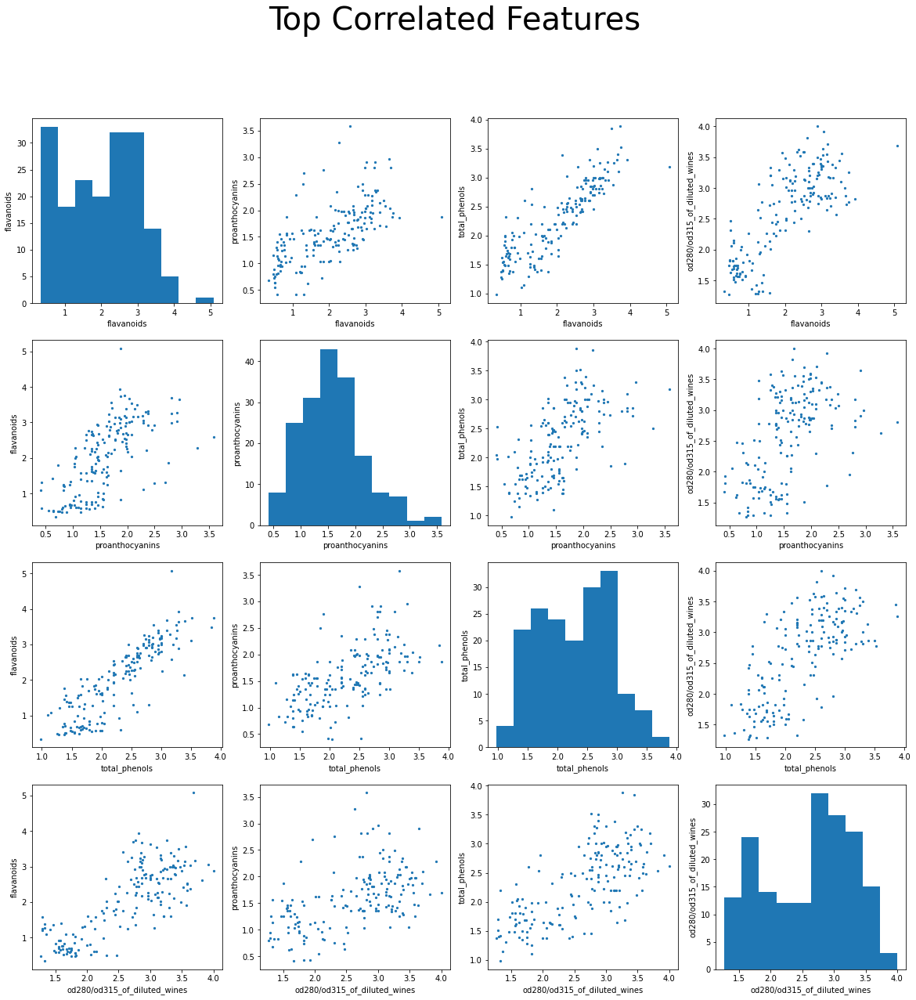

In [292]:
# plot the top features graphs
features = list(newData.columns)
figure, axs = plt.subplots(4,4, figsize = (20,20))
figure.suptitle('Top Correlated Features', fontsize=40)
for i, attribute_1 in enumerate(features):
    for j, attribute_2 in enumerate(features):
        if i == j:
            axs[i,j].hist(newData[attribute_1])
            axs[i,j].set(xlabel=attribute_1, ylabel=attribute_2)
            
        else:
            axs[i,j].scatter(newData[attribute_1], newData[attribute_2], 20, marker=".", alpha=1)
            axs[i,j].set(xlabel=attribute_1, ylabel=attribute_2)
#plt.show()


In [293]:
#get top right triangle indices
indices = []

for i in range(1, len(newData.columns)):
    for j in range(0, i):
        indices.append((j, i))

In [294]:
#save pairs of features
feats = []
for i in range(len(indices)):
    feats.append((features[indices[i][0]], features[indices[i][1]]))

In [295]:
feats.sort()

In [296]:
probabilities = [[0]*3 for i in range(178)]
k = 3
prediction = pd.DataFrame()
for feature in feats:
    ft1 = feature[0]
    ft2 = feature[1]
    #ft1 = 'flavanoids'
    #ft2 = 'od280/od315_of_diluted_wines'
    
    feature1 = np.array(newData[ft1])
    feature2 = np.array(newData[ft2])
    
    datapoints = np.column_stack((feature1, feature2))
    data = pd.DataFrame(datapoints)
    covMatrix = data.corr()
    
    means = getMus(datapoints, k=3)
    means = means[means[:, 0].argsort()]
            
    nearest_mus = find_nearest_mu(datapoints, means)
    
    
    
    for n in range(k):
        x = np.array([])
        y = np.array([])
        for index in range(len(nearest_mus)):
            if nearest_mus[index] == n:
                
                x = np.append(x, feature1[index])
                y = np.append(y, feature2[index])
                
        newDF = pd.DataFrame()
        newDF[ft1] = x
        newDF[ft2] = y
        covMatrix = newDF.corr()
        mu_k = means[n]
        const = 1 / (2*np.pi*np.sqrt(np.linalg.det(covMatrix)))
        for idx in range(data.shape[0]):
            x = [datapoints[idx][0] - mu_k[0]]
            y = [datapoints[idx][1] - mu_k[1]]
            
            ptSub = np.array([x,y])
            ptSubT = -ptSub.T
            covInv = np.linalg.inv(covMatrix)
            exp = np.matmul(np.matmul(ptSubT, covInv), ptSub) / 2
            exponent = np.exp(exp[0][0])
            prob = const*exponent
            probabilities[idx][n] = prob
    preds = [0]*len(probabilities)
    for i in range(len(probabilities)):
        Max = max(probabilities[i])
        preds[i] = probabilities[i].index(Max)
    prediction[ft1+' '+ft2] = preds

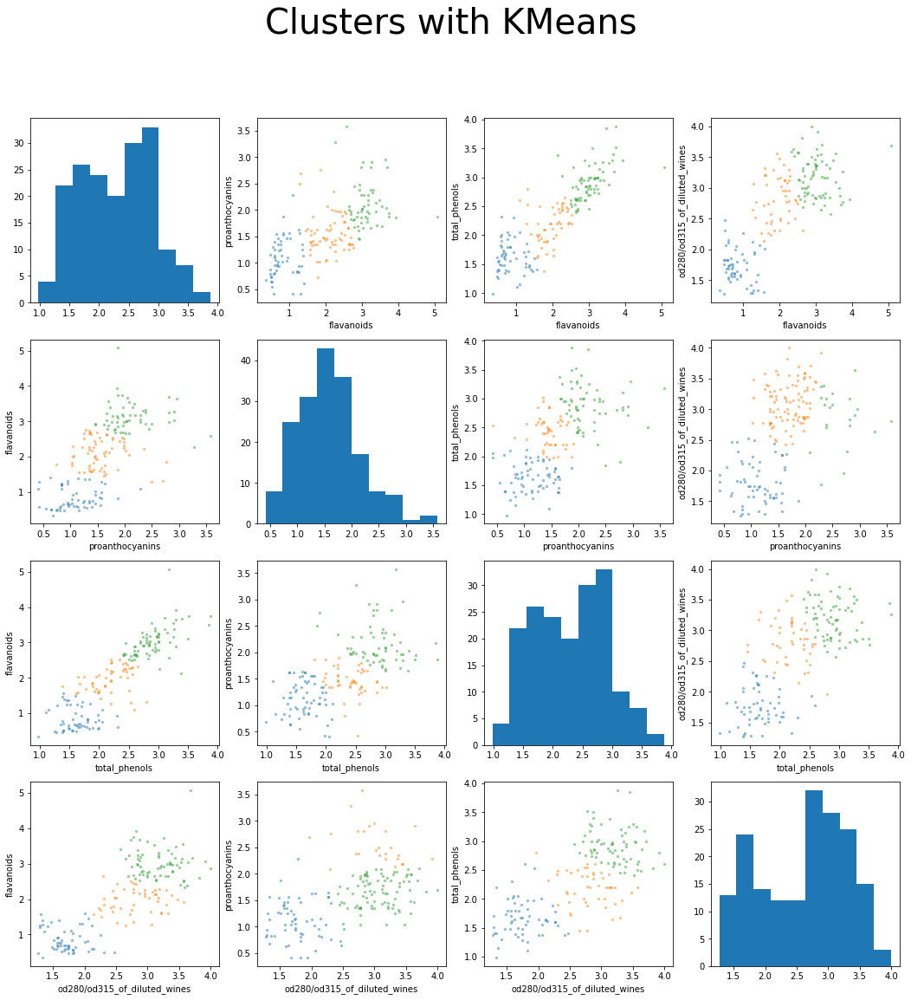

In [297]:
#print(datapoints)
k = 3

def initialize_mus(datapoints, k):
    mus = datapoints.copy()
    np.random.shuffle(mus)
    mus = mus[:k]
    return mus

def find_nearest_mu(datapoints, mus):
    distances = []
    for point in datapoints:
        mu_dist = []
        for k in range(len(mus)):
            dist = np.linalg.norm(point-mus[k])
            mu_dist = np.append(mu_dist, dist)
        distances = np.append(distances, np.argmin(mu_dist))
    return distances

def change_mus(datapoints, distances):
    new_mus = np.zeros((k, 2))
    counts = [0]*k
    for i in range(len(datapoints)):
        nearest_mu = int(distances[i])
        new_mus[nearest_mu] = np.add(new_mus[nearest_mu], datapoints[i])
        counts[nearest_mu] += 1
    counts = np.array(counts)
    counts = np.matlib.repmat(counts, 2, 1)
    new_mus = np.divide(new_mus, counts.T)
    return new_mus

# K-means algorithm
def getMus(datapoints, k):
    mus = initialize_mus(datapoints, k)
    #print(mus)
    epochs = 30
    for _ in range(epochs):
        distances = find_nearest_mu(datapoints, mus)
        mus = change_mus(datapoints, distances)
        
    return mus[mus[:, 0].argsort()]
    
figure, axs = plt.subplots(4,4, figsize = (18,18))
figure.suptitle('Clusters with KMeans', fontsize=40)
for i in range(4):
    for j in range(4):
        if i != j:
            ft1Name = newData.columns[i]
            ft2Name = newData.columns[j]
            
            feature1 = np.array(newData[ft1Name])
            feature2 = np.array(newData[ft2Name])
            datapoints = np.column_stack((feature1,feature2))
            k = 3
            
            mus = getMus(datapoints, k)
            
            nearest_mus = find_nearest_mu(datapoints, mus)
                
                
            for k in range(k):
                x = np.array([])
                y = np.array([])
                for index in range(len(nearest_mus)):
                    if nearest_mus[index] == k:
                        x = np.append(x, feature1[index])
                        y = np.append(y, feature2[index])
                axs[i,j].scatter(x, y, 20, marker=".", alpha=0.4)
                axs[i,j].set(xlabel=ft1Name, ylabel=ft2Name)
                
        if i == j:
            axs[i,j].hist(feature1)


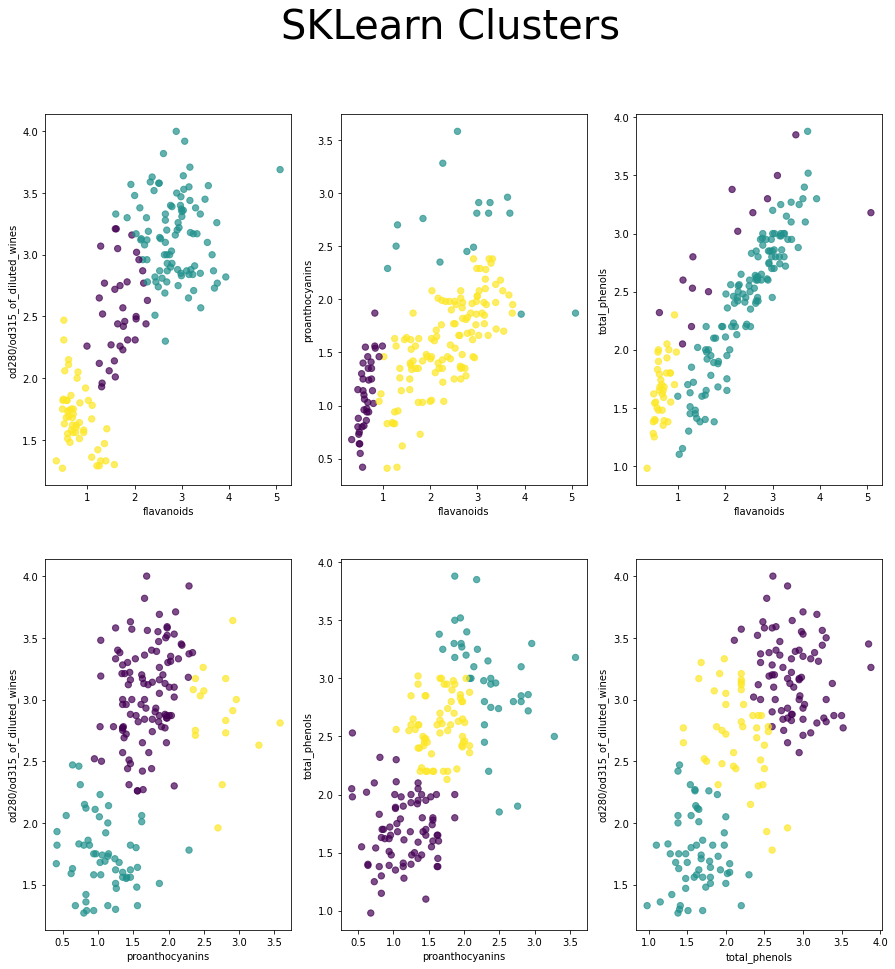

In [298]:
fig, axs = plt.subplots(2, 3, figsize = (15,15))
fig.suptitle('SKLearn Clusters', fontsize=40)
sklearnPreds = pd.DataFrame()
for i in range(len(feats)):
    ft1 = feats[i][0]
    ft2 = feats[i][1]
    X = newData[[ft1, ft2]]
    gmm = GaussianMixture(n_components=3).fit(X)
    labels = gmm.predict(X)
    sklearnPreds[ft1+' '+ft2] = labels
    if i == 0:
        axs[0, 0].scatter(X[ft1], X[ft2], c=labels, s=40, cmap='viridis', alpha=0.7)
        axs[0, 0].set(xlabel=ft1, ylabel=ft2)
    elif i == 1:
        axs[0, 1].scatter(X[ft1], X[ft2], c=labels, s=40, cmap='viridis', alpha=0.7)
        axs[0, 1].set(xlabel=ft1, ylabel=ft2)

    elif i == 2:
        axs[0, 2].scatter(X[ft1], X[ft2], c=labels, s=40, cmap='viridis', alpha=0.7)
        axs[0, 2].set(xlabel=ft1, ylabel=ft2)

    elif i == 3:
        axs[1, 0].scatter(X[ft1], X[ft2], c=labels, s=40, cmap='viridis', alpha=0.7)
        axs[1, 0].set(xlabel=ft1, ylabel=ft2)

    elif i == 4:
        axs[1, 1].scatter(X[ft1], X[ft2], c=labels, s=40, cmap='viridis', alpha=0.7)
        axs[1, 1].set(xlabel=ft1, ylabel=ft2)

    elif i == 5:
        axs[1, 2].scatter(X[ft1], X[ft2], c=labels, s=40, cmap='viridis', alpha=0.7)
        axs[1, 2].set(xlabel=ft1, ylabel=ft2)



In [300]:
target['sklearn'] = labels
cnt = 0
for row in target.index:
    if (target['target'][row] == 0) and (target['sklearn'][row] == 1):
        cnt += 1
    elif (target['target'][row] == 1) and (target['sklearn'][row] == 2):
        cnt += 1
    elif (target['target'][row] == 2) and (target['sklearn'][row] == 0):
        cnt += 1
accuracy = cnt/target.shape[0]
print('sklearn accuracy: ', accuracy)
print()
print(np.array(target['target']))
np.array(target['sklearn'])


sklearn accuracy:  0.19101123595505617

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 0, 1, 2,
       0, 0, 2, 2, 1, 0, 2, 0, 0, 1, 2, 2, 2, 0, 0, 2, 2, 1, 2, 2, 1, 2,
       2, 2, 1, 2, 1, 0, 0, 2, 1, 2, 0, 0, 2, 2, 0, 2, 0, 2, 2, 1, 0, 0,
       0, 2, 2, 2, 0, 2, 2, 2, 1, 2, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1])

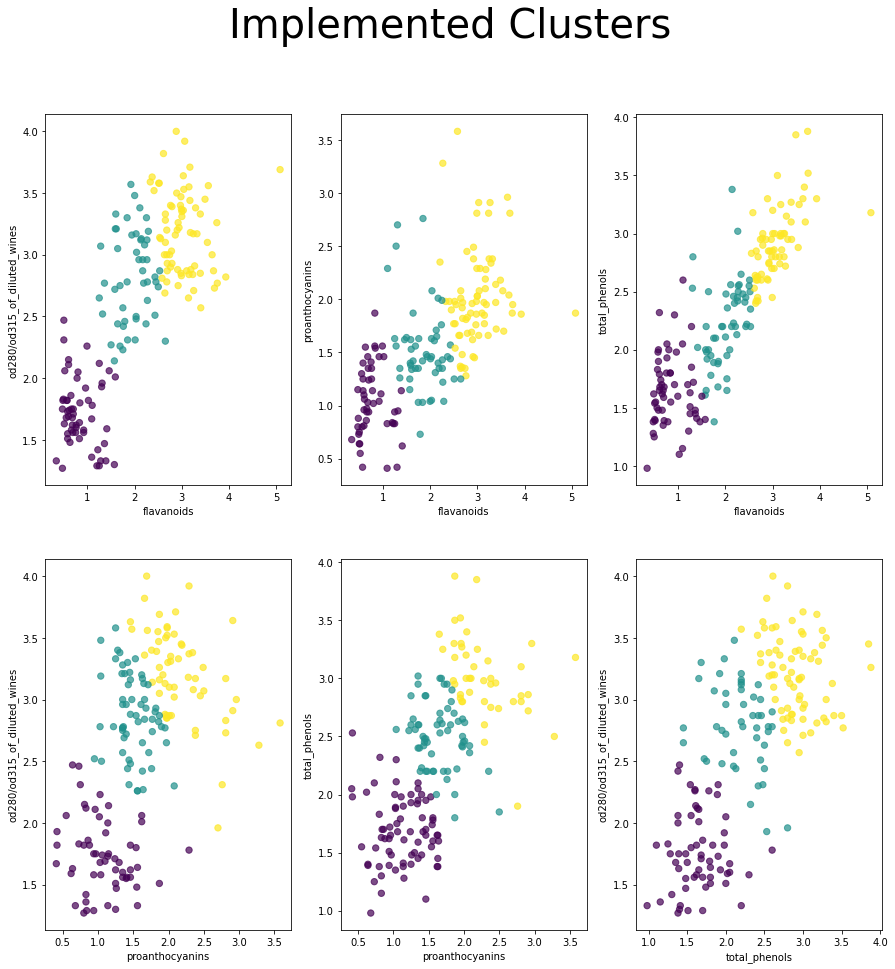

In [301]:
fig, axs = plt.subplots(2, 3, figsize = (15,15))
fig.suptitle('Implemented Clusters', fontsize=40)
for i in range(len(feats)):
    ft1 = feats[i][0]
    ft2 = feats[i][1]
    labels = np.array(prediction[ft1+' '+ft2])
    if i == 0:
        axs[0, 0].scatter(newData[ft1], newData[ft2], c=labels, s=40, cmap='viridis', alpha=0.7)
        axs[0, 0].set(xlabel=ft1, ylabel=ft2)
    elif i == 1:
        axs[0, 1].scatter(newData[ft1], newData[ft2], c=labels, s=40, cmap='viridis', alpha=0.7)
        axs[0, 1].set(xlabel=ft1, ylabel=ft2)

    elif i == 2:
        axs[0, 2].scatter(newData[ft1], newData[ft2], c=labels, s=40, cmap='viridis', alpha=0.7)
        axs[0, 2].set(xlabel=ft1, ylabel=ft2)

    elif i == 3:
        axs[1, 0].scatter(newData[ft1], newData[ft2], c=labels, s=40, cmap='viridis', alpha=0.7)
        axs[1, 0].set(xlabel=ft1, ylabel=ft2)

    elif i == 4:
        axs[1, 1].scatter(newData[ft1], newData[ft2], c=labels, s=40, cmap='viridis', alpha=0.7)
        axs[1, 1].set(xlabel=ft1, ylabel=ft2)

    elif i == 5:
        axs[1, 2].scatter(newData[ft1], newData[ft2], c=labels, s=40, cmap='viridis', alpha=0.7)
        axs[1, 2].set(xlabel=ft1, ylabel=ft2)

In [302]:
testPred = [0]*prediction.shape[0]
def most_common(lst):
    return max(set(lst), key=lst.count)

for row in prediction.index:
    l = []
    for col in prediction.columns:
        l.append(prediction[col][row])
    testPred[row] = most_common(l)
testPred = pd.DataFrame(testPred)

In [303]:
target = pd.DataFrame(wine.target)
target['target'] = target
target['prediction'] = testPred

In [305]:
cnt = 0
for row in target.index:
    if (target['target'][row] == 0) and (target['prediction'][row] == 2):
        cnt += 1
    elif (target['target'][row] == 1) and (target['prediction'][row] == 1):
        cnt += 1
    elif (target['target'][row] == 2) and (target['prediction'][row] == 0):
        cnt += 1
accuracy = cnt/target.shape[0]
print('Implementation Accuracy', accuracy)
print()
print(np.array(target['target']))
print(np.array(target['prediction']))

Implementation Accuracy 0.7752808988764045

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
[2 2 2 2 2 2 2 1 2 2 2 1 1 2 2 2 2 2 2 2 2 2 2 1 2 2 2 1 2 2 2 2 2 2 1 2 1
 1 1 2 2 1 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 1 2 0 1 2 1 0 1 0 2 1 2
 1 0 1 0 1 2 1 1 1 0 1 1 1 1 1 1 0 1 0 1 1 1 0 1 2 2 1 1 1 1 1 1 1 1 1 2 2
 1 1 1 1 1 1 1 0 1 2 2 1 2 2 2 2 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


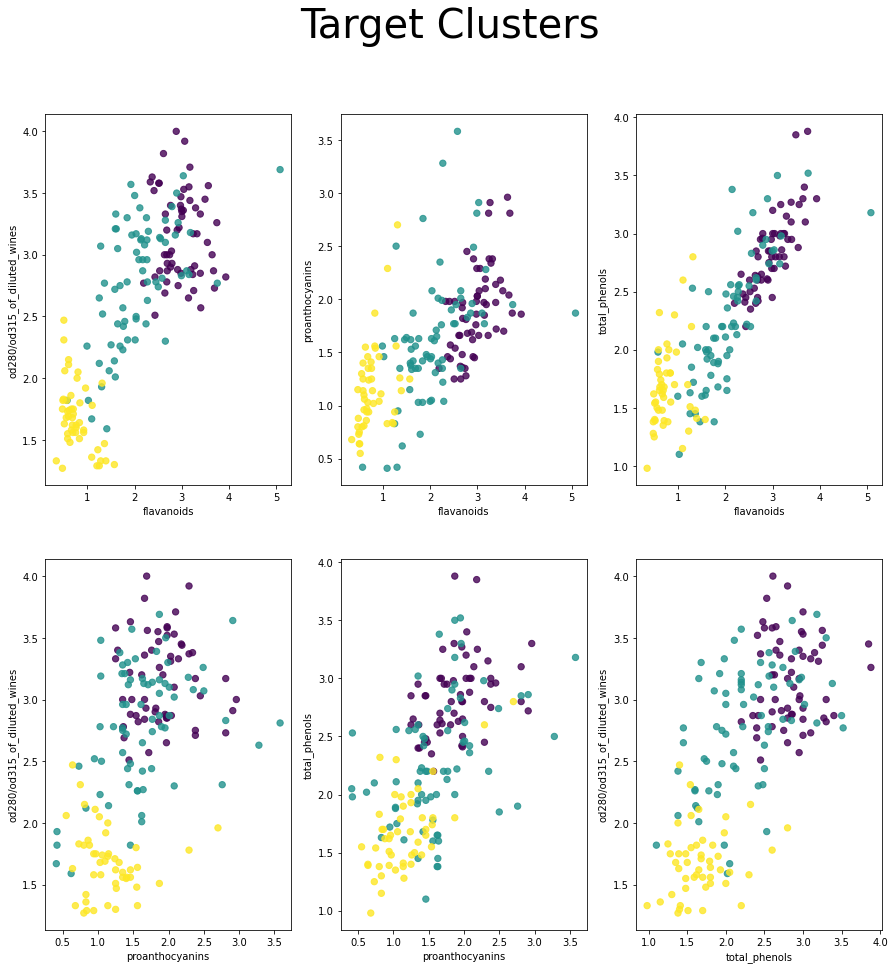

In [306]:
fig, axs = plt.subplots(2, 3, figsize = (15,15))
fig.suptitle('Target Clusters', fontsize=40)
for i in range(len(feats)):
    ft1 = feats[i][0]
    ft2 = feats[i][1]
    labels = np.array(target['target'])
    if i == 0:
        axs[0, 0].scatter(newData[ft1], newData[ft2], c=labels, s=40, cmap='viridis', alpha=0.8)
        axs[0, 0].set(xlabel=ft1, ylabel=ft2)
    elif i == 1:
        axs[0, 1].scatter(newData[ft1], newData[ft2], c=labels, s=40, cmap='viridis', alpha=0.8)
        axs[0, 1].set(xlabel=ft1, ylabel=ft2)

    elif i == 2:
        axs[0, 2].scatter(newData[ft1], newData[ft2], c=labels, s=40, cmap='viridis', alpha=0.8)
        axs[0, 2].set(xlabel=ft1, ylabel=ft2)

    elif i == 3:
        axs[1, 0].scatter(newData[ft1], newData[ft2], c=labels, s=40, cmap='viridis', alpha=0.8)
        axs[1, 0].set(xlabel=ft1, ylabel=ft2)

    elif i == 4:
        axs[1, 1].scatter(newData[ft1], newData[ft2], c=labels, s=40, cmap='viridis', alpha=0.8)
        axs[1, 1].set(xlabel=ft1, ylabel=ft2)

    elif i == 5:
        axs[1, 2].scatter(newData[ft1], newData[ft2], c=labels, s=40, cmap='viridis', alpha=0.8)
        axs[1, 2].set(xlabel=ft1, ylabel=ft2)

In [307]:
wine = datasets.load_wine()
#wine = wine['data']
feature_names = wine['feature_names']

data = pd.DataFrame(wine['data'], columns=feature_names)
t = wine['target']
target = pd.DataFrame()
target['target'] = t
target
n = 13
sortedCovs = sortCovMatrix(normData, n)

In [308]:
newData = data[data.columns]
newData

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95.0,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740.0
174,13.40,3.91,2.48,23.0,102.0,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750.0
175,13.27,4.28,2.26,20.0,120.0,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835.0
176,13.17,2.59,2.37,20.0,120.0,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840.0


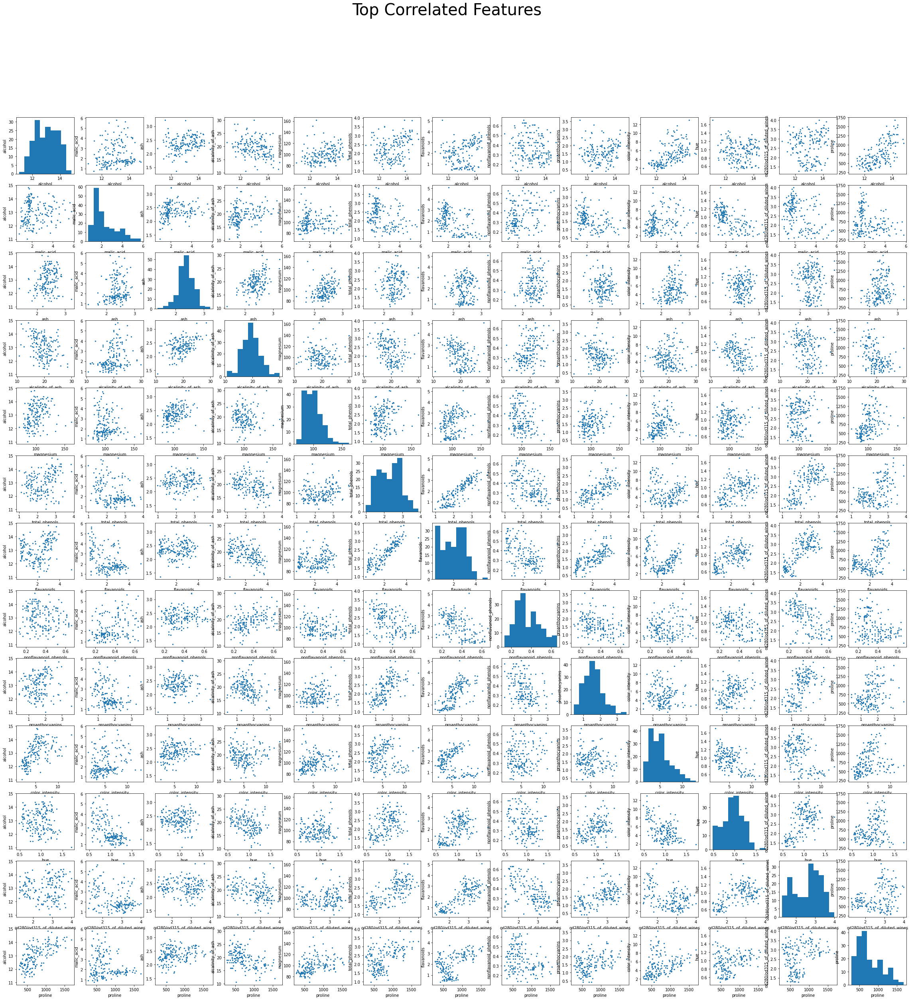

In [309]:
# plot the top features graphs
features = list(newData.columns)
figure, axs = plt.subplots(13,13, figsize = (40,40))
figure.suptitle('Top Correlated Features', fontsize=40)
for i, attribute_1 in enumerate(features):
    for j,attribute_2 in enumerate(features):
        if i == j:
            axs[i,j].hist(newData[attribute_1])
            axs[i,j].set(xlabel=attribute_1, ylabel=attribute_2)
            
        else:
            axs[i,j].scatter(newData[attribute_1], newData[attribute_2], 20, marker=".", alpha=1)
            axs[i,j].set(xlabel=attribute_1, ylabel=attribute_2)

In [167]:
indices = []

for i in range(1, len(newData.columns)):
    for j in range(0, i):
        indices.append((j, i))
feats = []
for i in range(len(indices)):
    feats.append((features[indices[i][0]], features[indices[i][1]]))


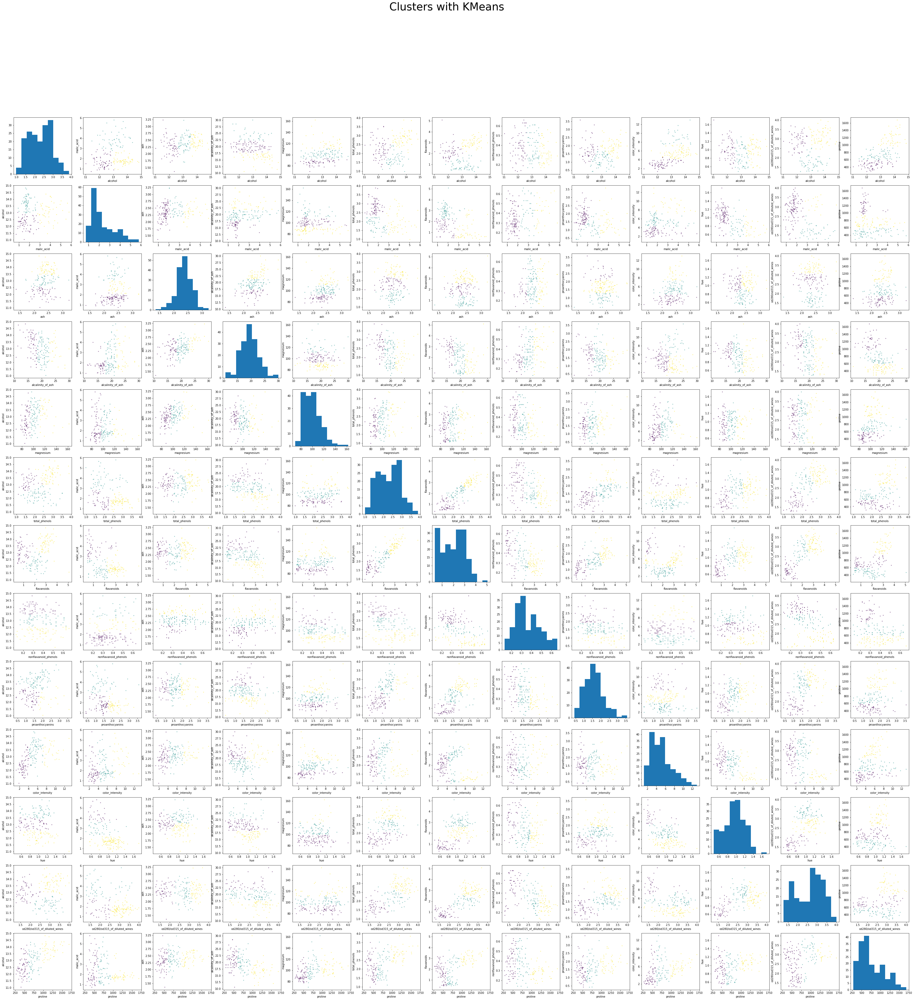

In [168]:
k = 3
def initialize_mus(datapoints, k):
    mus = datapoints.copy()
    np.random.shuffle(mus)
    mus = mus[:k]
    return mus

def find_nearest_mu(datapoints, mus):
    distances = []
    for point in datapoints:
        mu_dist = []
        for k in range(len(mus)):
            dist = np.linalg.norm(point-mus[k])
            mu_dist = np.append(mu_dist, dist)
        distances = np.append(distances, np.argmin(mu_dist))
    return distances

def change_mus(datapoints, distances):
    new_mus = np.zeros((k, 2))
    counts = [0]*k
    for i in range(len(datapoints)):
        nearest_mu = int(distances[i])
        new_mus[nearest_mu] = np.add(new_mus[nearest_mu], datapoints[i])
        counts[nearest_mu] += 1
    counts = np.array(counts)
    counts = matlib.repmat(counts, 2, 1)
    new_mus = np.divide(new_mus, counts.T)
    return new_mus

# K-means algorithm
def getMus(datapoints, k):
    mus = initialize_mus(datapoints, k)

    epochs = 30
    for _ in range(epochs):
        distances = find_nearest_mu(datapoints, mus)
        mus = change_mus(datapoints, distances)
        
    return mus[mus[:, 0].argsort()]

#plot K-Means clustering
figure, axs = plt.subplots(13,13, figsize = (60,60))
figure.suptitle('Clusters with KMeans', fontsize=40)
for i in range(13):
    for j in range(13):
        if i != j:
            ft1Name = newData.columns[i]
            ft2Name = newData.columns[j]
            
            feature1 = np.array(newData[ft1Name])
            feature2 = np.array(newData[ft2Name])
            datapoints = np.column_stack((feature1,feature2))
            k = 3
            
            mus = getMus(datapoints, k)
            
            nearest_mus = find_nearest_mu(datapoints, mus)
            labels = nearest_mus
            axs[i,j].scatter(feature1, feature2, 20, marker=".",c=labels ,cmap='viridis', alpha=0.4)
            axs[i,j].set(xlabel=ft1Name, ylabel=ft2Name)
                
        if i == j:
            axs[i,j].hist(feature1)

In [169]:
prediction = pd.DataFrame()
for feature in feats:
    prods = pd.DataFrame()
    probabilities = [[0]*3 for i in range(178)]
    ft1 = feature[0]
    ft2 = feature[1]
    #ft1 = 'flavanoids'
    #ft2 = 'od280/od315_of_diluted_wines'
    
    feature1 = np.array(newData[ft1])
    feature2 = np.array(newData[ft2])
    
    datapoints = np.column_stack((feature1, feature2))
    data = pd.DataFrame(datapoints)
    covMatrix = data.corr()
    
    means = getMus(datapoints, k=3)
    means = means[means[:, 0].argsort()]
            
    nearest_mus = find_nearest_mu(datapoints, means)
    
    
    
    for n in range(k):
        x = np.array([])
        y = np.array([])
        for index in range(len(nearest_mus)):
            if nearest_mus[index] == n:
                
                x = np.append(x, feature1[index])
                y = np.append(y, feature2[index])
                
        newDF = pd.DataFrame()
        newDF[ft1] = x
        newDF[ft2] = y
        covMatrix = newDF.corr()
        mu_k = means[n]
        const = 1 / (2*np.pi*np.sqrt(np.linalg.det(covMatrix)))
        for idx in range(data.shape[0]):
            x = [datapoints[idx][0] - mu_k[0]]
            y = [datapoints[idx][1] - mu_k[1]]
            
            ptSub = np.array([x,y])
            ptSubT = -ptSub.T
            covInv = np.linalg.inv(covMatrix)
            exp = np.matmul(np.matmul(ptSubT, covInv), ptSub) / 2
            exponent = np.exp(exp[0][0])
            prob = const*exponent
            probabilities[idx][n] = prob
    preds = [0]*len(probabilities)
    for i in range(len(probabilities)):
        Max = max(probabilities[i])
        preds[i] = probabilities[i].index(Max)
    prediction[ft1+' '+ft2] = preds

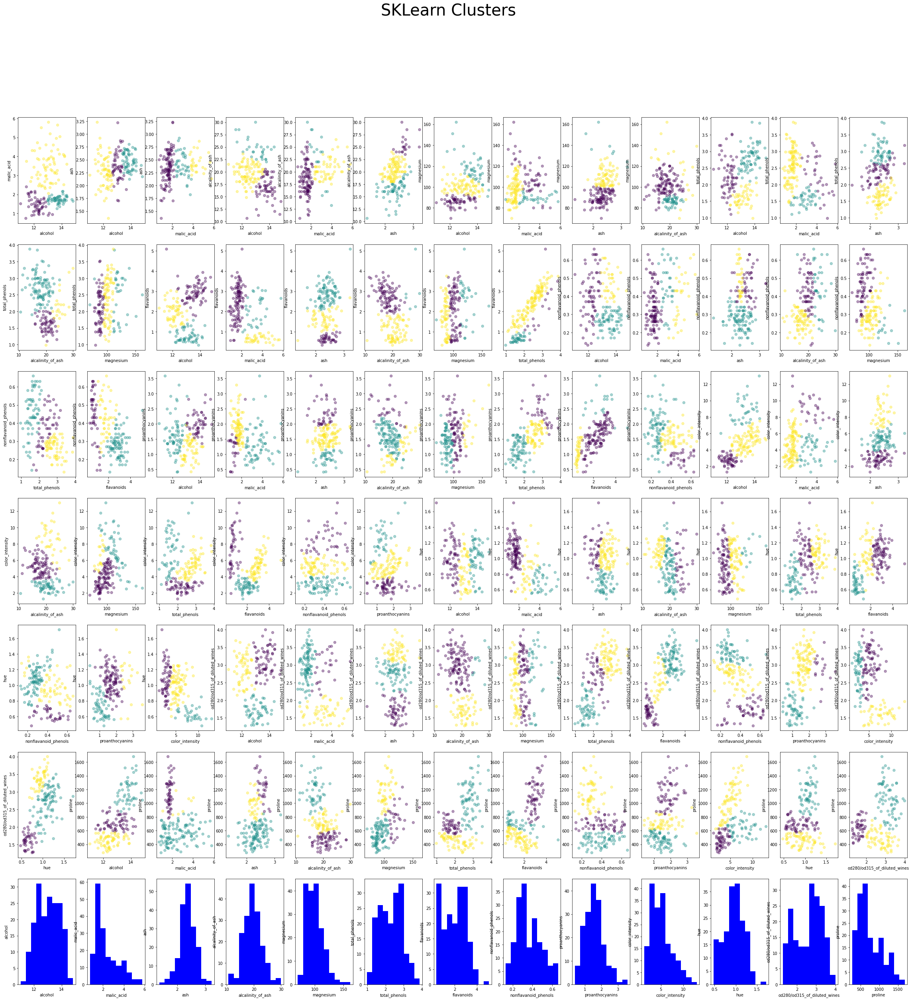

In [173]:
fig, axs = plt.subplots(7, 13, figsize = (40,40))
fig.suptitle('SKLearn Clusters', fontsize=40)
for i in range(len(feats)):
    ft1 = feats[i][0]
    ft2 = feats[i][1]
    X = newData[[ft1, ft2]]
    gmm = GaussianMixture(n_components=3).fit(X)
    labels = gmm.predict(X)
    x = math.floor(i/13)
    y = i % 13
    #print(x,y)
    axs[x, y].scatter(X[ft1], X[ft2], c=labels, s=40, cmap='viridis', alpha=0.4)
    axs[x, y].set(xlabel=ft1, ylabel=ft2)
for i in range(13):
    ft = newData[newData.columns[i]]
    axs[6,i].hist(ft, color='blue')
    axs[6,i].set(xlabel=newData.columns[i], ylabel=newData.columns[i])


In [188]:
target['sklearn'] = labels
cnt = 0
for row in target.index:
    if (target['target'][row] == 0) and (target['sklearn'][row] == 1):
        cnt += 1
    elif (target['target'][row] == 1) and (target['sklearn'][row] == 2):
        cnt += 1
    elif (target['target'][row] == 2) and (target['sklearn'][row] == 0):
        cnt += 1
accuracy = cnt/target.shape[0]
print('sklearn accuracy: ', accuracy)

sklearn accuracy:  0.8820224719101124


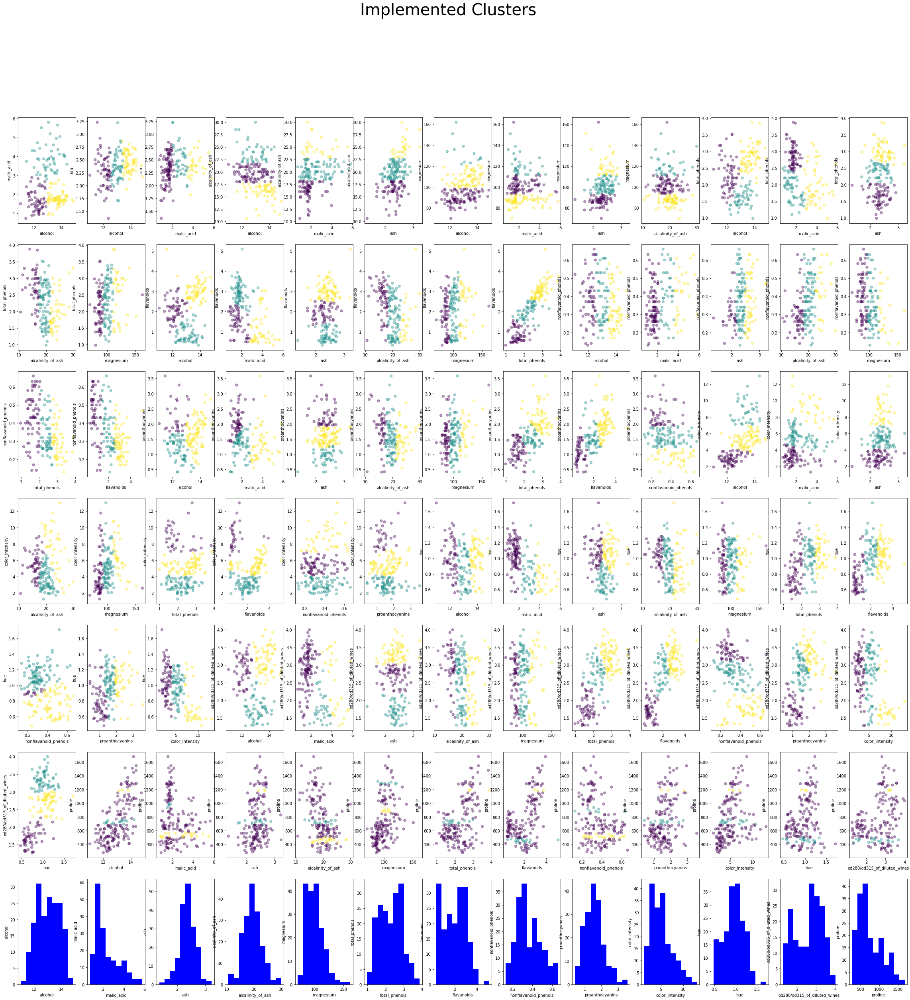

In [172]:
fig, axs = plt.subplots(7, 13, figsize = (40,40))
fig.suptitle('Implemented Clusters', fontsize=40)
for i in range(len(feats)):
    ft1 = feats[i][0]
    ft2 = feats[i][1]
    labels = np.array(prediction[ft1+' '+ft2])
    
    x = math.floor(i/13)
    y = i % 13
    #print(x,y)
    axs[x, y].scatter(newData[ft1], newData[ft2], c=labels, s=40, cmap='viridis', alpha=0.4)
    axs[x, y].set(xlabel=ft1, ylabel=ft2)
    for i in range(13):
        ft = newData[newData.columns[i]]
        axs[6,i].hist(ft,color='blue')
        axs[6,i].set(xlabel=newData.columns[i], ylabel=newData.columns[i])

In [182]:
testPred = [0]*prediction.shape[0]
def most_common(lst):
    return max(set(lst), key=lst.count)

for row in prediction.index:
    l = []
    for col in prediction.columns:
        l.append(prediction[col][row])
    testPred[row] = most_common(l)
testPred = pd.DataFrame(testPred)

target = pd.DataFrame(wine.target)
target['target'] = target
target['prediction'] = testPred

In [183]:
cnt = 0
for row in target.index:
    if (target['target'][row] == 0) and (target['prediction'][row] == 2):
        cnt += 1
    elif (target['target'][row] == 2) and (target['prediction'][row] == 1):
        cnt += 1
    elif (target['target'][row] == 1) and (target['prediction'][row] == 0):
        cnt += 1
accuracy = cnt/target.shape[0]
print('Implementation Accuracy', accuracy)

Implementation Accuracy 0.5674157303370787


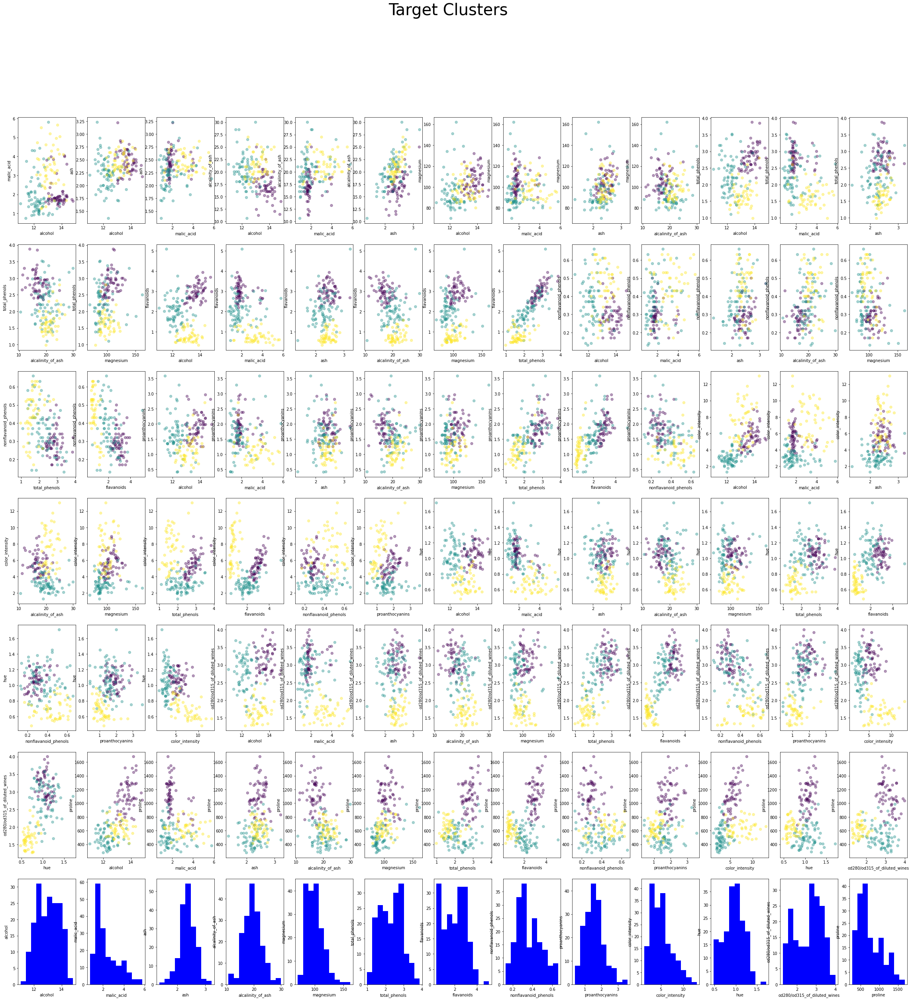

In [189]:
fig, axs = plt.subplots(7, 13, figsize = (40,40))
fig.suptitle('Target Clusters', fontsize=40)
for i in range(len(feats)):
    ft1 = feats[i][0]
    ft2 = feats[i][1]
    labels = np.array(target['target'])
    x = math.floor(i/13)
    y = i % 13
    #print(x,y)
    axs[x, y].scatter(newData[ft1], newData[ft2], c=labels, s=40, cmap='viridis', alpha=0.4)
    axs[x, y].set(xlabel=ft1, ylabel=ft2)
    
    for i in range(13):
        ft = newData[newData.columns[i]]
        axs[6,i].hist(ft,color='blue')
        axs[6,i].set(xlabel=newData.columns[i], ylabel=newData.columns[i])

In [279]:
list(target['target']).index(1)


59